In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle
%matplotlib inline

# For plotting in a separate window
# %matplotlib qt

In [2]:
# Some functions which will be used to display images

def show_2_images(input_image, output_image, input_title='Input Image', output_title='Output Image'):
    """
    Display 2 images side by side on a subplot grid.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    
    ax1.imshow(input_image)
    ax1.axis('off')
    ax1.set_title(input_title, fontsize=30)

    ax2.imshow(output_image)
    ax2.axis('off')
    ax2.set_title(output_title, fontsize=30)


def show_image(image, title='Image'):
    """
    Display 1 image.
    """

    plt.figure(figsize=(11, 6))
    plt.imshow(image)
    plt.axis('off')
    plt.title(title, fontsize=30)


In [12]:
# Camera calibration

# Arrays to store object points and image points from all the images
objpoints = []  # 3D points in real world space
imgpoints = []  # 2D points in image plane

def calibrate(show_images=False):
    # prepare object points
    nx = 9  # number of inside corners in x
    ny = 6  # number of inside corners in y
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    count_chessboards = 0   # 2: Show 2 images side-by-side; 1: show 1 image alone

    # Read in and make a list of calibration images
    images = glob.glob('./camera_cal/calibration*.jpg')

    for fname in images:

        # read in each image
        img = cv2.imread(fname)

        # Convert image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If corners are found, add object points, image points
        if ret == True:
            
            imgpoints.append(corners)
            objpoints.append(objp)

            # draw and display the corners
            img_chessb = np.copy(img)
            img_chessb = cv2.drawChessboardCorners(img_chessb, (nx, ny), corners, ret)

            if show_images:
                count_chessboards += 1      # increment internal counter

                if count_chessboards == 2:
                    # show 2 images side by side
                    show_2_images(img_chessb0, img_chessb, input_title=title_chessb0, output_title=fname.replace("./camera_cal\\", ""))
                    count_chessboards = 0
                else:
                    # count_chessboards = 1
                    img_chessb0 = np.copy(img_chessb)   # copy image
                    title_chessb0 = fname.replace("./camera_cal\\", "")     # copy image title

        if show_images:
            # there might be a single image left
            if count_chessboards == 1:
                # also show this last image
                show_image(img_chessb0, title_chessb0)

calibrate(show_images=False)        # to see all the calibrated images change show_images to True

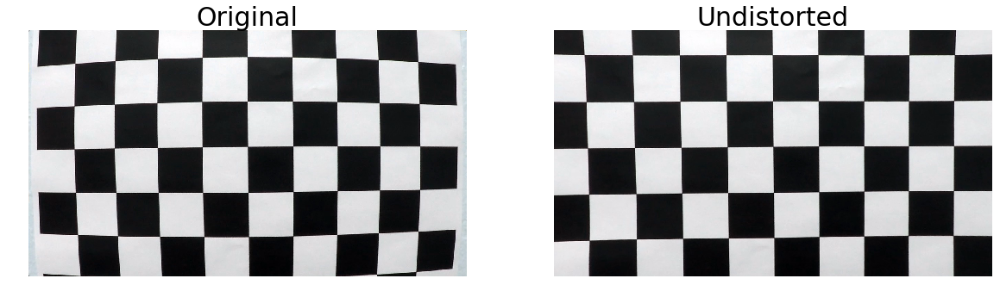

In [15]:
# Distortion correction

# Defined a function to undistort an image based on the calculations from the cell above
def undistort_image(image):
    """
    Removes distortion from an image
    """
    img_size = (image.shape[1], image.shape[0])

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    return undist

# Showing an example of a distortion corrected calibration image.
test_image = cv2.imread('./camera_cal/calibration1.jpg')
show_2_images(test_image, undistort_image(test_image), input_title='Original', output_title='Undistorted')

# save the images
# mpimg.imsave('./output_images/' + fname.replace("./camera_cal\\", ""), img_chessb)

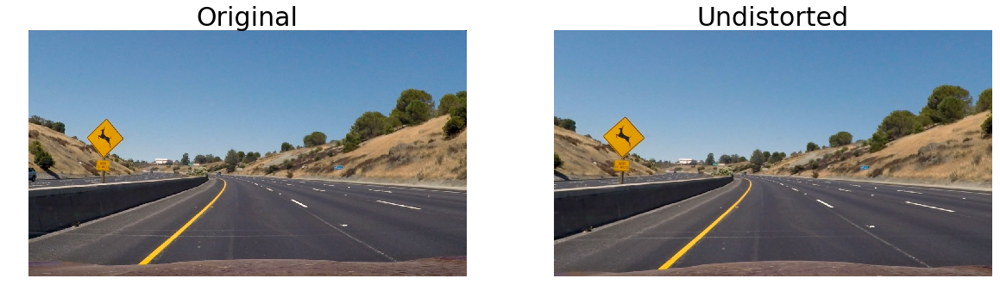

In [22]:
# providing an example of a distortion-corrected image

def process_undistortion(show_images=False):

    undistorted_images = []
    distorted_images = []
    images = glob.glob('./test_images/*.jpg')

    for fname in images:
        image = cv2.imread(fname)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        distorted_images.append(image)

        undistorted = undistort_image(image)
        undistorted_images.append(undistorted)
        
        if show_images:
            show_2_images(image, undistorted, input_title='Original', output_title='Undistorted')
        
    return distorted_images, undistorted_images

# process undistortion over all images in test_images
distorted_images, undistorted_images = process_undistortion(show_images=False)
# Just show one example of a distortion corrected image:
show_2_images(distorted_images[3], undistorted_images[3], input_title='Original', output_title='Undistorted')

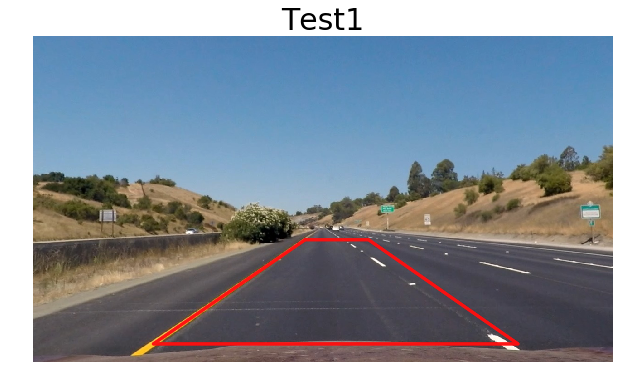

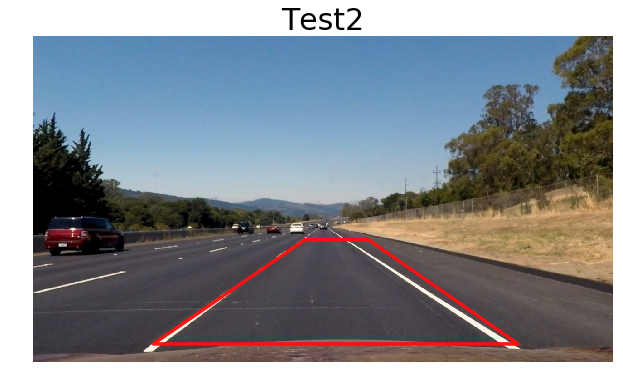

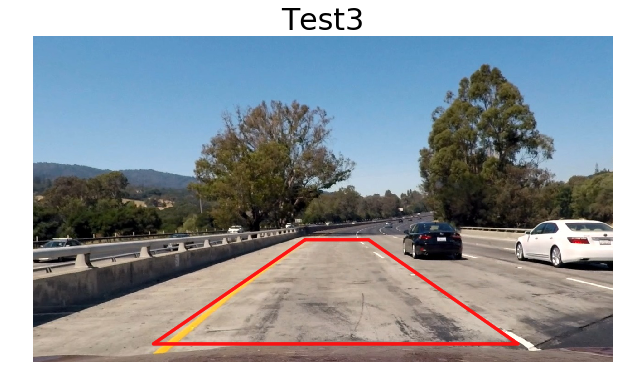

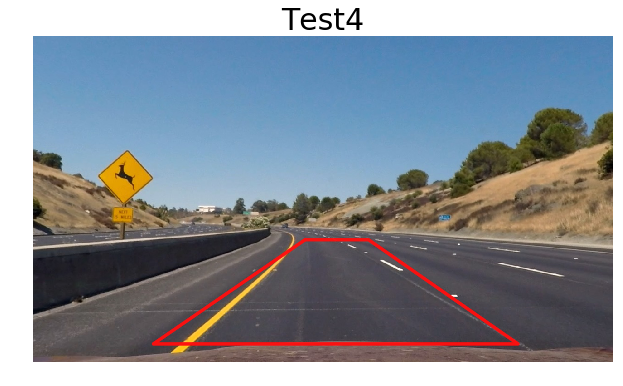

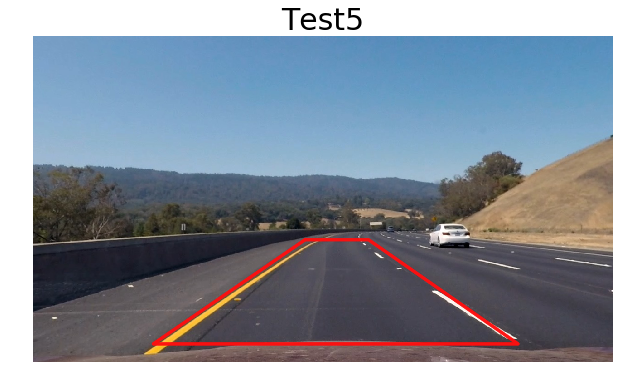

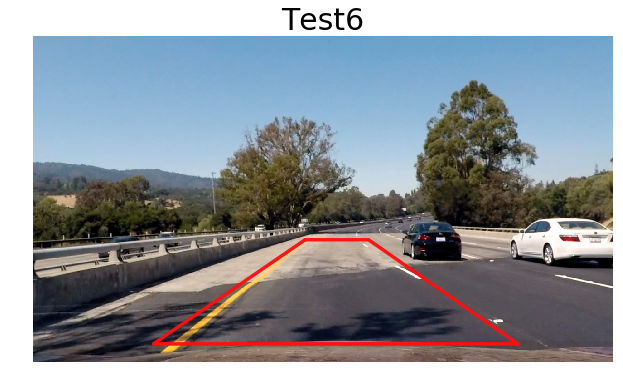

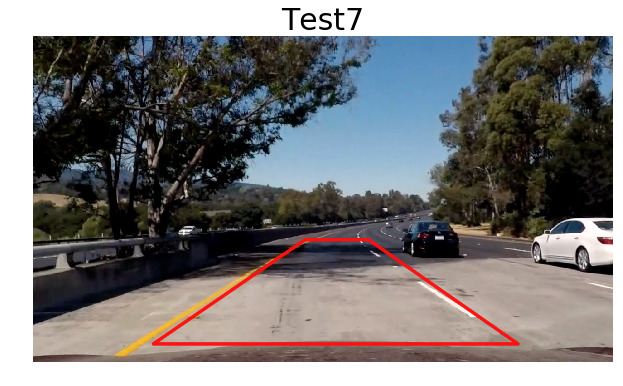

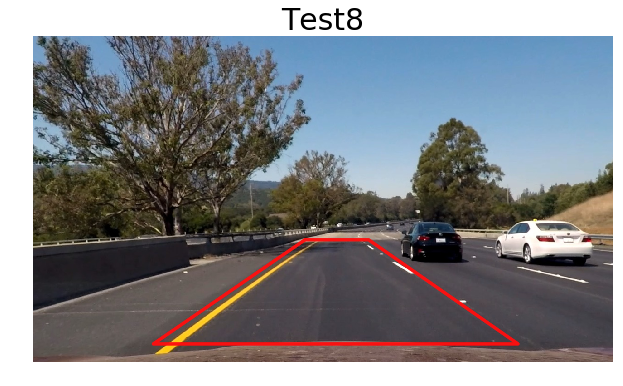

In [23]:
# Perspective Transform

# After the images are undistorted I use perspective transformation to
# get a more accurate view of the lane lines.

# To do that, I defined an area to transform. I used windows paint one some examples to
# get the coordinates for the points:
x = [600.0, 740.0, 1070.0, 265.0, 600.0]
y = [450.0, 450.0, 680.0, 680.0, 450.0]

# Now I will plot the defined area into the undistorted images
for i, image in enumerate(undistorted_images): 
    show_image(image, 'Test' + str(i + 1))

    for _ in x:
        plt.plot(x, y, color='#ff1010', alpha=0.5, linewidth=3, solid_capstyle='round', zorder=2)
    

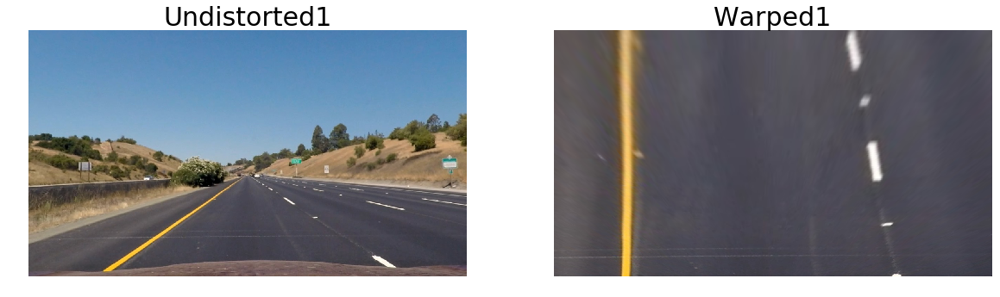

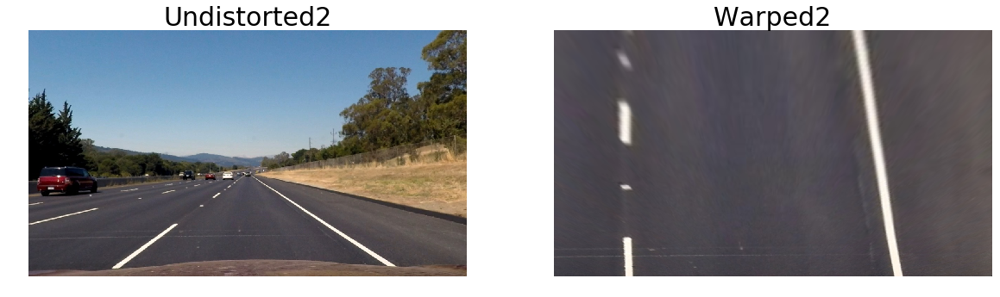

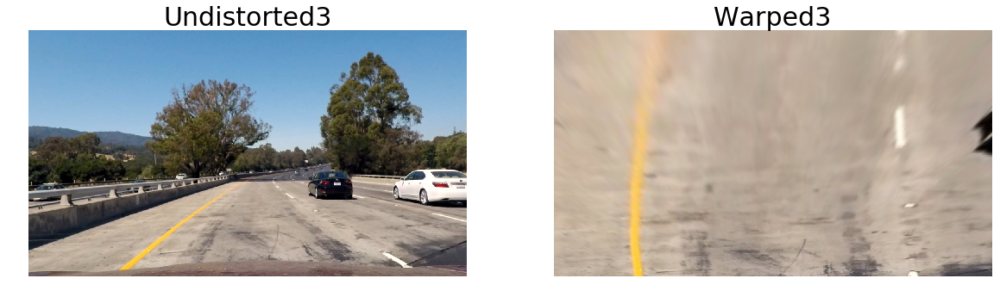

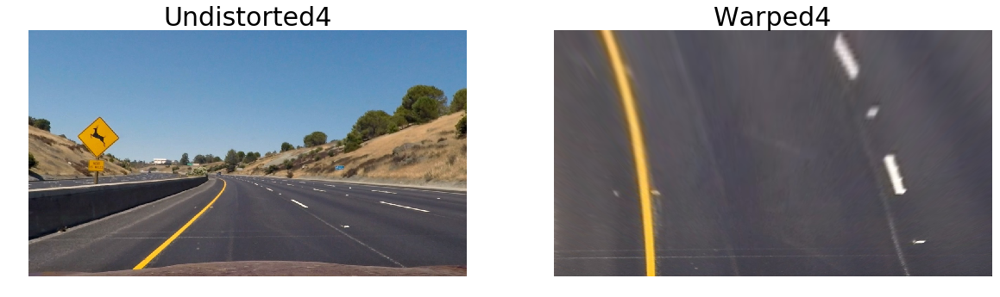

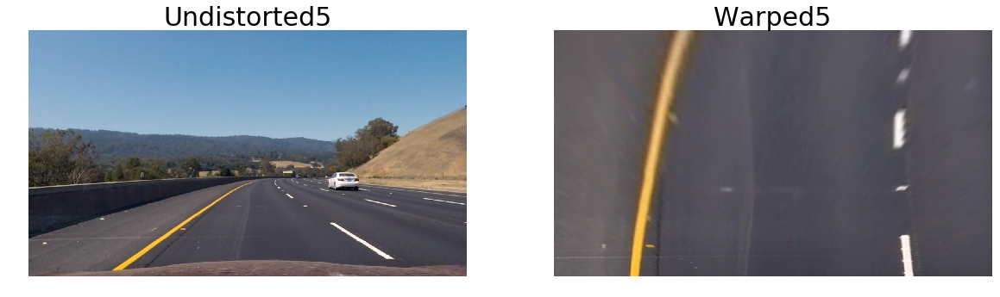

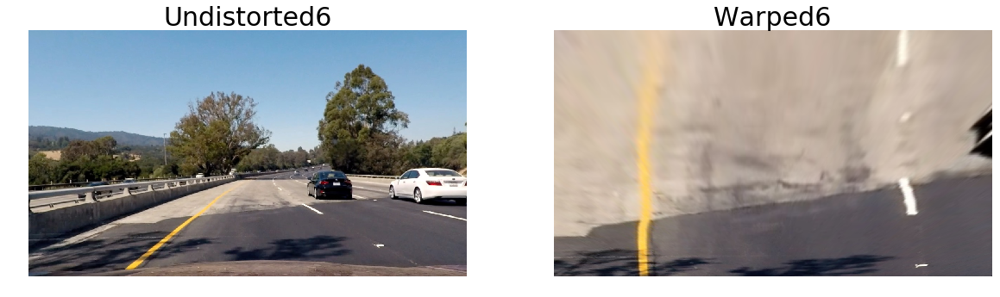

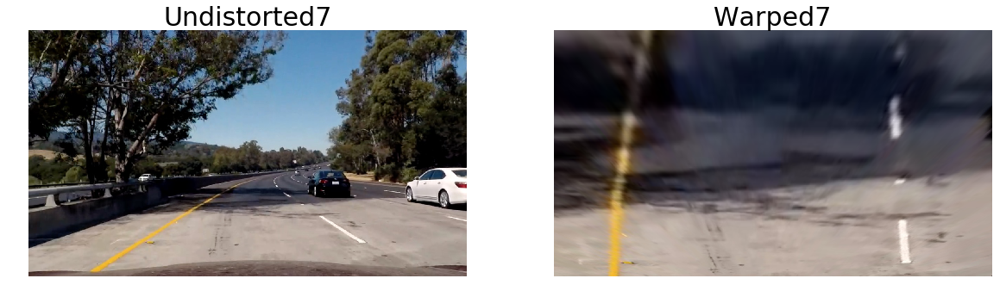

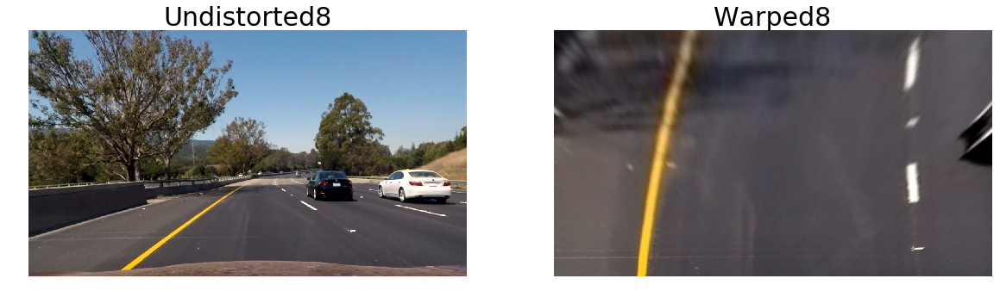

In [25]:
def warp(img):
    """
    returns a warped image
    """

    img_size = (img.shape[1], img.shape[0])

    src = np.float32(
        [[600, 450],
        [740, 450],
        [1070, 680],
        [265, 680]])

    dst = np.float32(
        [[200, 0],
        [img_size[0] - 200, 0],
        [img_size[0] - 200, img_size[1]],
        [200, img_size[1]]])

    # Compute the perspective transform matrix M
    M = cv2.getPerspectiveTransform(src, dst)

    # Create warped image - uses linear inerpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    return warped

for i, image in enumerate(undistorted_images):
    show_2_images(image, warp(image), input_title='Undistorted' + str(i + 1) , output_title='Warped' + str(i + 1))
